# Import libraries

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import folium

from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

import joblib

import time
import os

# Import Data

In [2]:
# Direct path to file - update as needed 
file_df_Natschen_46_large='/Users/ze/Documents/Coding/Projects/2024/alturos/data/raw/Natschen-2024-02-04_12-01-46.csv'

# Create dataframe from filepath 
df_Natschen_46_large=pd.read_csv(file_df_Natschen_46_large)

In [3]:
# current df to work on
df=df_Natschen_46_large

In [4]:
# Verify 
df

,Timestamp,gyroZ(rad/s),gyroY(rad/s),gyroX(rad/s),accelUserZ(g),accelUserY(g),accelUserX(g),RelativeAltitude(meters),Pressure(kilopascals),accelZ(g),...,magZ(µT),magY(µT),magX(µT),qZ,qY,qX,qW,Roll(rads),Pitch(rads),Yaw(rads)
0,2024-02-04 12:01:50,0.012828,-0.010996,-0.065363,-0.284546,0.334194,-0.217142,4.711182,825.902588,9.637094,...,-421.204987,-263.202789,-179.291199,0.891079,0.004830,0.051985,0.450836,-0.088542,-0.055511,-2.207269
1,2024-02-04 12:01:51,0.061697,0.004123,0.098197,0.406693,0.458599,-0.023087,5.532837,825.819092,10.023534,...,-420.521790,-261.763184,-178.046799,0.893117,-0.006002,0.035450,0.448386,-0.068774,-0.021071,-2.211750
2,2024-02-04 12:01:52,0.033292,-0.123853,0.154549,-0.258639,0.354392,-0.155479,7.054810,825.664185,9.959526,...,-420.448578,-261.946198,-178.266403,0.893826,-0.001073,0.039969,0.446628,-0.072514,-0.033792,-2.216033
3,2024-02-04 12:01:53,0.003360,-0.012065,0.174402,0.144100,0.432030,-0.164175,8.547729,825.512207,10.100702,...,-420.424194,-263.971405,-178.937393,0.895916,0.010839,0.049285,0.441348,-0.078982,-0.062966,-2.228626
4,2024-02-04 12:01:54,-0.029169,0.074678,-0.117439,0.077817,0.316531,-0.230572,9.776367,825.387085,9.798011,...,-418.801605,-266.252808,-178.437195,0.900734,0.017218,0.044881,0.431704,-0.066194,-0.069825,-2.250036
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11332,2024-02-04 16:06:19,-0.036499,-0.700204,0.231671,0.095654,-0.510474,-0.912364,-270.801392,854.334839,7.841280,...,-421.314789,-238.229401,-211.950592,-0.106067,-0.186111,0.169994,0.961881,-0.353360,-0.375254,0.151883
11333,2024-02-04 16:06:20,0.162185,-0.201280,0.037415,-0.090846,0.192925,0.034612,-267.376953,853.976929,8.509476,...,-422.363983,-231.556000,-207.570801,-0.114659,-0.065866,0.122912,0.983569,-0.105096,-0.259803,0.218360
11334,2024-02-04 16:06:21,0.269392,0.298866,-0.087965,-1.006895,0.493402,-0.332721,-268.093018,854.051697,11.081161,...,-424.706390,-234.947601,-194.602203,-0.099826,-0.059151,0.194946,0.973926,-0.083011,-0.402301,0.187348
11335,2024-02-04 16:06:22,-0.088270,0.128587,0.382707,0.447941,-0.251145,1.058801,-268.581909,854.102783,10.051650,...,-425.182190,-237.094803,-205.801804,-0.058196,-0.155774,0.072220,0.983429,-0.306661,-0.160870,0.093301


# Helper functions

In [5]:
def convert_datetime(df):

    # Convert 'Timestamp' column to datetime format
    df['Timestamp'] = pd.to_datetime(df['Timestamp'], unit='ns')

    return df

In [6]:
def reduce_sampling_rate(df):
    df.set_index('Timestamp', inplace=True)
    # Set the 'Timestamp' column as the DataFrame's index
    df_resampled = df.resample('S').first()
    # Reset the index to create a standard numerical index
    df_resampled.reset_index(inplace=True)
    return df_resampled

In [7]:
def plot_total_alt_over_time(df, plot_title='Total Tracked Altitude Over Time'):

    # Create the scatter plot using Plotly Express
    fig = px.scatter(df,
                     x=df['Timestamp'],
                     y=df['Alt(m)'])

    # Update the layout with title and axis labels
    fig.update_layout(
            title='Altitude over Time',
            xaxis_title='Timestamp',
            yaxis_title='Altitude (m)',
            coloraxis_colorbar=dict(title='Cluster Label'),
            width=1000,
            height=600
        )

    # Show the Plotly figure
    fig.show()

In [8]:
def plot_manual_labeling(df):
    # Plot for Altitude over Time, colored by 'on_lift' status
    plt.figure(figsize=(15, 10))

    # Plot points where 'on_lift' is 1 with one color
    plt.scatter(df.loc[df['on_lift'] == 1, 'Timestamp'],
                df.loc[df['on_lift'] == 1, 'Alt(m)'],
                c='red',
                label='On the lift',
                marker='o')

    # Plot points where 'on_lift' is 0 with another color
    plt.scatter(df.loc[df['on_lift'] == 0, 'Timestamp'],
                df.loc[df['on_lift'] == 0, 'Alt(m)'],
                c='blue',
                label='Not on the lift',
                marker='o')

    plt.title('Labeled Data')
    plt.xlabel('Timestamp')
    plt.ylabel('Altitude (m)')
    plt.legend()
    plt.show()

In [9]:
def map_lift_rides(df):
    # Create a map centered on the mean latitude and longitude
    map_center = [df['Lat'].mean(),
                  df['Long'].mean()]
    mymap = folium.Map(location=map_center, zoom_start=10)

    # Plot data points with on_lift type
    on_lift = df[df['on_lift'] == 1]
    for index, row in on_lift.iterrows():
        folium.CircleMarker(location=[row['Lat'],
                                      row['Long']],
                            radius=5,
                            color='red',
                            fill=True,
                            fill_color='red',
                            tooltip=str(row['Timestamp'])).add_to(mymap)

    # Plot data points with not_on_lift types
    not_on_lift = df[df['on_lift'] != 1]
    for index, row in not_on_lift.iterrows():
        folium.CircleMarker(location=[row['Lat'],
                                      row['Long']],
                            radius=5,
                            color='blue',
                            fill=True,
                            fill_color='blue',
                            tooltip=str(row['Timestamp'])).add_to(mymap)

    # Return the map object
    return mymap


In [10]:
#Map all tracked movement based on lat and long of GPS data

def map_tracked_movement(df, zoom_start=12):
    # Create a map centered on the mean latitude and longitude
    map_center = [df['Lat'].mean(), df['Long'].mean()]
    movement_on_map = folium.Map(location=map_center, zoom_start=zoom_start)

    # Add CircleMarkers for each data point
    for index, row in df.iterrows():
        folium.CircleMarker(location=[
                            row['Lat'], 
                            row['Long']], 
                            radius=5, 
                            color='blue', 
                            fill=True, 
                            fill_color='blue').add_to(movement_on_map)

    # Display the map
    return movement_on_map

In [11]:
#Map only lifts rides

def map_lift_rides(df, column='on_lift', zoom_start=15):
    # Create a map centered on the mean latitude and longitude
    map_center = [df['Lat'].mean(), df['Long'].mean()]
    lift_map = folium.Map(location=map_center, zoom_start=zoom_start)

    # Plot data points with on_lift type
    on_lift = df[df[column] == 1]
    for _, row in on_lift.iterrows():
        folium.CircleMarker(location=[row['Lat'],
                                      row['Long']],
                                      radius=5,
                                      color='red',
                                      fill=True,
                                      fill_color='red',
                                      tooltip=str(row['Timestamp'])).add_to(lift_map)

    # Return the map object
    return lift_map

# Reduce sample size 

In [12]:
# Use helper function to convert 'Timestamp' column dytpe 
df=convert_datetime(df)
# Verify 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11337 entries, 0 to 11336
Data columns (total 32 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Timestamp                 11337 non-null  datetime64[ns]
 1   gyroZ(rad/s)              11337 non-null  float64       
 2   gyroY(rad/s)              11337 non-null  float64       
 3   gyroX(rad/s)              11337 non-null  float64       
 4   accelUserZ(g)             11337 non-null  float64       
 5   accelUserY(g)             11337 non-null  float64       
 6   accelUserX(g)             11337 non-null  float64       
 7   RelativeAltitude(meters)  11337 non-null  float64       
 8   Pressure(kilopascals)     11337 non-null  float64       
 9   accelZ(g)                 11337 non-null  float64       
 10  accelY(g)                 11337 non-null  float64       
 11  accelX(g)                 11337 non-null  float64       
 12  VerticalAccuracy(m

In [13]:
# Use helper function to resample to seconds  
df_resampled=reduce_sampling_rate(df)
# Verify 
print(f'Shape before resampling: {df.shape}')
print(f'Shape after resampling: {df_resampled.shape}\n')
df_resampled.info()

Shape before resampling: (11337, 31)
Shape after resampling: (14675, 32)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14675 entries, 0 to 14674
Data columns (total 32 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Timestamp                 14675 non-null  datetime64[ns]
 1   gyroZ(rad/s)              11337 non-null  float64       
 2   gyroY(rad/s)              11337 non-null  float64       
 3   gyroX(rad/s)              11337 non-null  float64       
 4   accelUserZ(g)             11337 non-null  float64       
 5   accelUserY(g)             11337 non-null  float64       
 6   accelUserX(g)             11337 non-null  float64       
 7   RelativeAltitude(meters)  11337 non-null  float64       
 8   Pressure(kilopascals)     11337 non-null  float64       
 9   accelZ(g)                 11337 non-null  float64       
 10  accelY(g)                 11337 non-null  float64       
 11  accelX

In [14]:
# Verify by plotting
plot_total_alt_over_time(df_resampled)

In [15]:
# If needed: Export resampled dataframe to csv
name_of_csv_resampled='df_Natschen_46_resampled.csv'
df_resampled.to_csv(name_of_csv_resampled, index=False)

# Label data to prepare df for supervised learning

In [16]:
# Assign dataframe that is yet to be labeled
df_to_be_labeled=df_resampled
initial_shape_df_to_be_labeled=df_to_be_labeled.shape
print(f'Initial shape: {initial_shape_df_to_be_labeled}')

Initial shape: (14675, 32)


In [17]:
# Check for missing values and drop rows with missing values
df_to_be_labeled.isnull().sum()

Timestamp                      0
gyroZ(rad/s)                3338
gyroY(rad/s)                3338
gyroX(rad/s)                3338
accelUserZ(g)               3338
accelUserY(g)               3338
accelUserX(g)               3338
RelativeAltitude(meters)    3338
Pressure(kilopascals)       3338
accelZ(g)                   3338
accelY(g)                   3338
accelX(g)                   3338
VerticalAccuracy(m)         3338
HorizontalAccuracy(m)       3338
Speed(m/s)                  3338
Course                      3338
Alt(m)                      3338
Long                        3338
Lat                         3338
calMagZ(µT)                 3338
calMagY(µT)                 3338
calMagX(µT)                 3338
magZ(µT)                    3338
magY(µT)                    3338
magX(µT)                    3338
qZ                          3338
qY                          3338
qX                          3338
qW                          3338
Roll(rads)                  3338
Pitch(rads

In [18]:
# Drop rows with any missing values
df_to_be_labeled.dropna(inplace=True)
print(f'Initial shape: {initial_shape_df_to_be_labeled}')
print(f'New shape: {df_to_be_labeled.shape}')

Initial shape: (14675, 32)
New shape: (11337, 32)


In [19]:
map_tracked_movement(df_to_be_labeled)

In [20]:
# Plot alt over time 
plot_total_alt_over_time(df_to_be_labeled)

# Get time stamps from hovering over plot 

In [21]:
# Add 'on_lift' column to df and set all values to 0
df_to_be_labeled['on_lift'] = 0

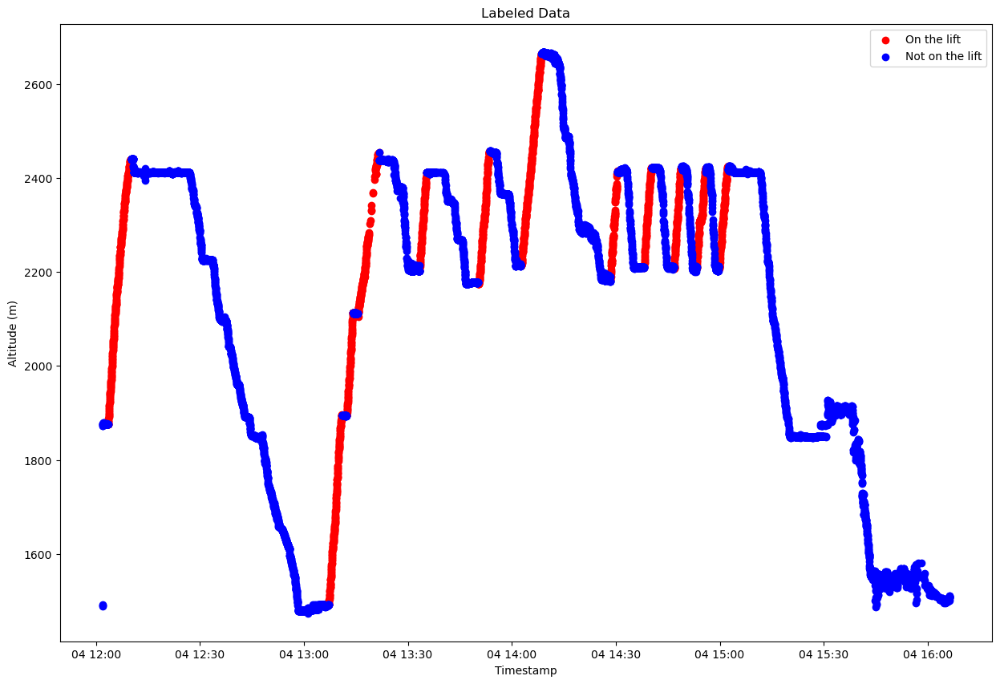

In [22]:
# Manually noted timestamps for lift rides
lift_rides = [

    ('2024-02-04 12:03:29', '2024-02-04 12:10:10'),
    ('2024-02-04 13:07:07', '2024-02-04 13:10:59'), 
    ('2024-02-04 13:12:12', '2024-02-04 13:14:13'), 
    ('2024-02-04 13:15:29', '2024-02-04 13:21:43'),
    ('2024-02-04 13:33:21', '2024-02-04 13:35:27'),
    ('2024-02-04 13:50:15', '2024-02-04 13:53:40'),
    ('2024-02-04 14:02:35', '2024-02-04 14:08:35'),
    ('2024-02-04 14:28:25', '2024-02-04 14:30:30'),
    ('2024-02-04 14:38:09', '2024-02-04 14:40:23'),
    ('2024-02-04 14:46:48', '2024-02-04 14:48:57'),   
    ('2024-02-04 14:53:20', '2024-02-04 14:56:00'), 
    ('2024-02-04 14:59:45', '2024-02-04 15:02:27'),   
    # ('2024-02-04 15:39:13', '2024-02-04 15:44:00'),    # this is a lift ride going down    
]

# Iterate and relabel df 
for start, end in lift_rides:
    # Update 'on_lift' column for rows where the timestamp falls within the lift ride's duration
    df_to_be_labeled.loc[(df_to_be_labeled['Timestamp'] >= start) & (df_to_be_labeled['Timestamp'] <= end), 'on_lift'] = 1

# Show plot with colored labels 
plot_manual_labeling(df_to_be_labeled)

# Show map with lift rides only 
lift_rides_map = map_lift_rides(df_to_be_labeled)
lift_rides_map

# Export

In [23]:
# export to CSV
name_of_csv_labeled='df_Natschen_46_relabeled.csv'
df_to_be_labeled.to_csv(name_of_csv_labeled, index=False)